Liang Zhao 260781081</br>
ECSE415 Assignment 2</br>
README:
- Please make sure you have downloaded opencv-python==3.4.2.16 by clikcing on the pip install bash code right below
- some questions are answered together in one code snippet, there will be comments the in code snippets to indicate which questions are answered in which code
- The table of contents has the oganized question lists

In [ ]:
# Please download specific version of python in order to use SIFT
!pip install opencv-python==3.4.2.16
!pip install opencv-contrib-python==3.4.2.16

In [ ]:
# all imports defined here
import cv2
import numpy as np
import matplotlib.pyplot as plt
import sklearn
from sklearn import datasets
%matplotlib inline

import os
import random
from sklearn.decomposition import PCA

#1 Invariance of SIFT Features

**SIFT function that will be used in part1 book and part 2 book reveal**

In [ ]:
# load the image
img_book = cv2.imread("book.jpg")
img_book = cv2.cvtColor(img_book, cv2.COLOR_BGR2RGB)

def ssift(img, scale, rotate):
    
  # image size
  height, width = img.shape[0:2] 
    
  if scale != None:
        img = cv2.resize(img, None, fx=scale, fy=scale)
        
  if rotate != None:
    # Create a rotated, scaled duplicate
    # rotate marix around the center pixel, 30 degrees, scale of 1.2
    T = cv2.getRotationMatrix2D((width/2, height/2, ), rotate, 1)
    # Apply the transformation matrix
    img = cv2.warpAffine(img, T, (int(width), int(height)))
    
  img2 = img.copy()
    
  # create a SIFT object
  sift = cv2.xfeatures2d.SIFT_create()

  # detect SIFT features with no masks
  keypoints = sift.detect(img, None)
  keypoints, descriptors = sift.compute(img, keypoints)

  # draw the keypoints
  cv2.drawKeypoints(img, keypoints, img, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  # display
  plt.figure(figsize=(20,20))
  plt.axis("off")
  plt.imshow(img)
  plt.show()
  # num of SIFT keypoints
  print('number of keypoints: '+ str(len(keypoints)))   
  return img2, keypoints, descriptors

##1.1 Invariance Under Changes in Scale

###1.1.1 Compute SIFT keypoints for the reference image
number of keypoints showed below each image

In [ ]:
origin_img, origin_key_point, org_descriptor = ssift(img_book, 1.0, None)

### 1.1.2. Scale reference image using scaling factors of (0.2, 0.5, 0.8, 1.25, 2, 5)

### 1.1.3. Compute SIFT keypoints for the transformed images
SIFT keypoints are shown below each image

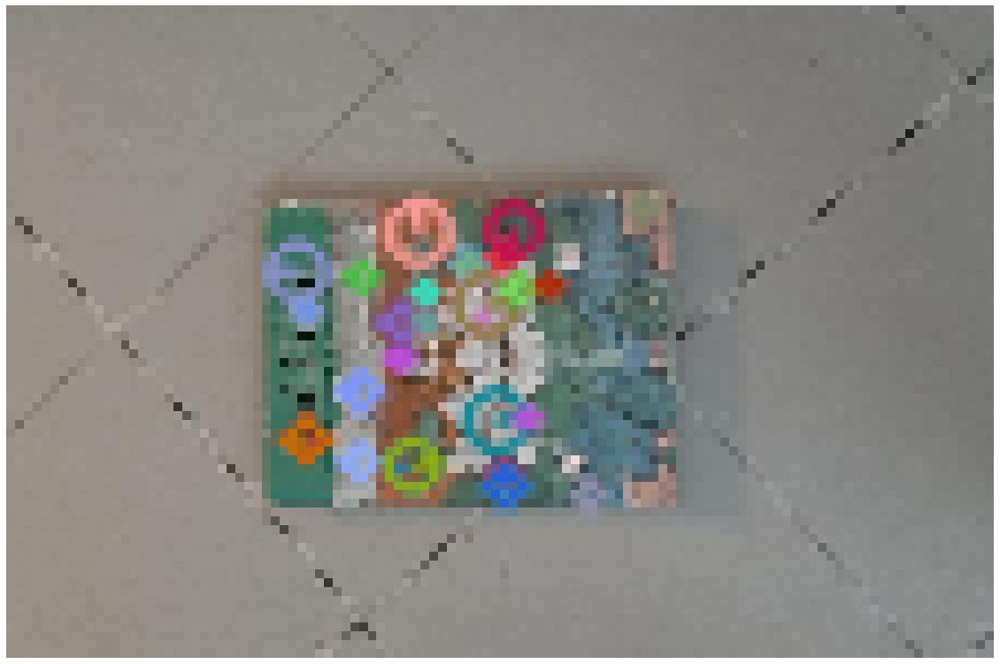

number of keypoints: 35


In [ ]:
transformed_images = []
transformed_images.append(ssift(img_book, 0.2, None))

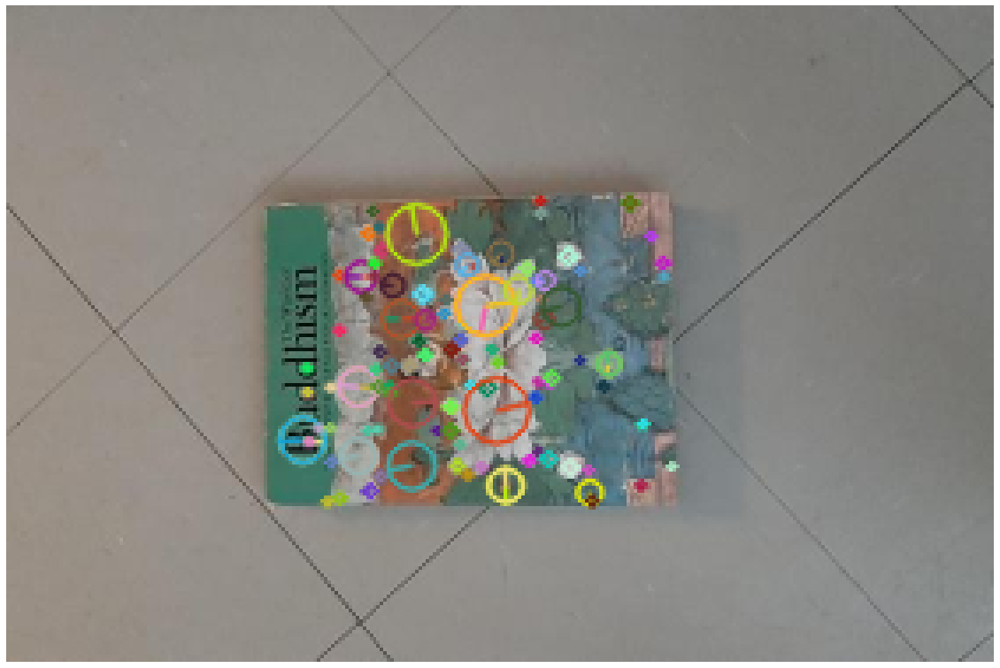

number of keypoints: 122


In [ ]:
transformed_images.append(ssift(img_book, 0.5, None))

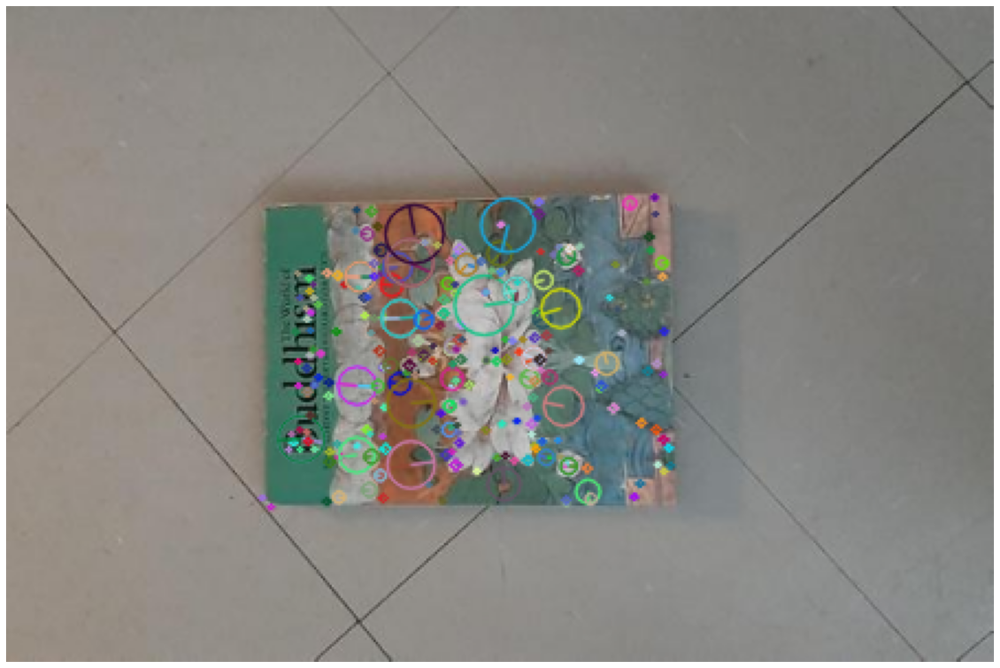

number of keypoints: 312


In [ ]:
transformed_images.append(ssift(img_book, 0.8, None))

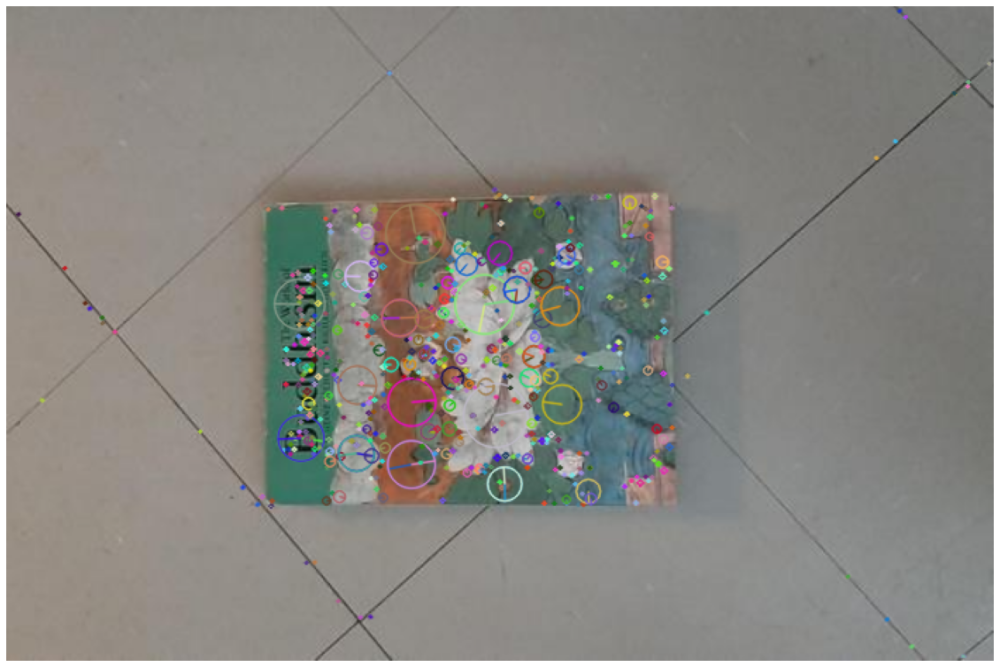

number of keypoints: 699


In [ ]:
transformed_images.append(ssift(img_book, 1.25, None))

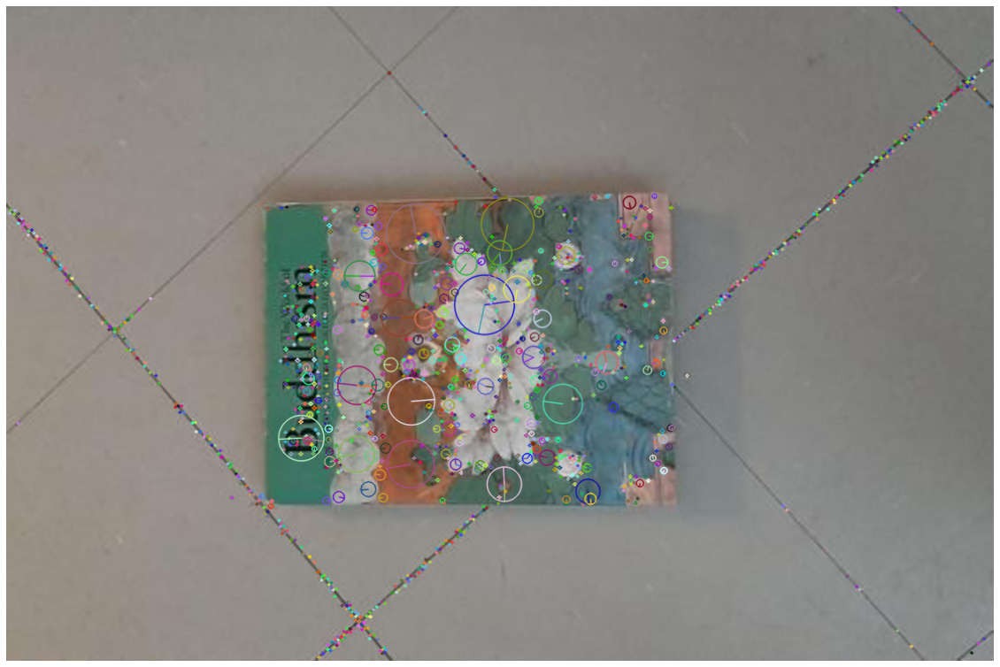

number of keypoints: 1633


In [ ]:
transformed_images.append(ssift(img_book, 2, None))

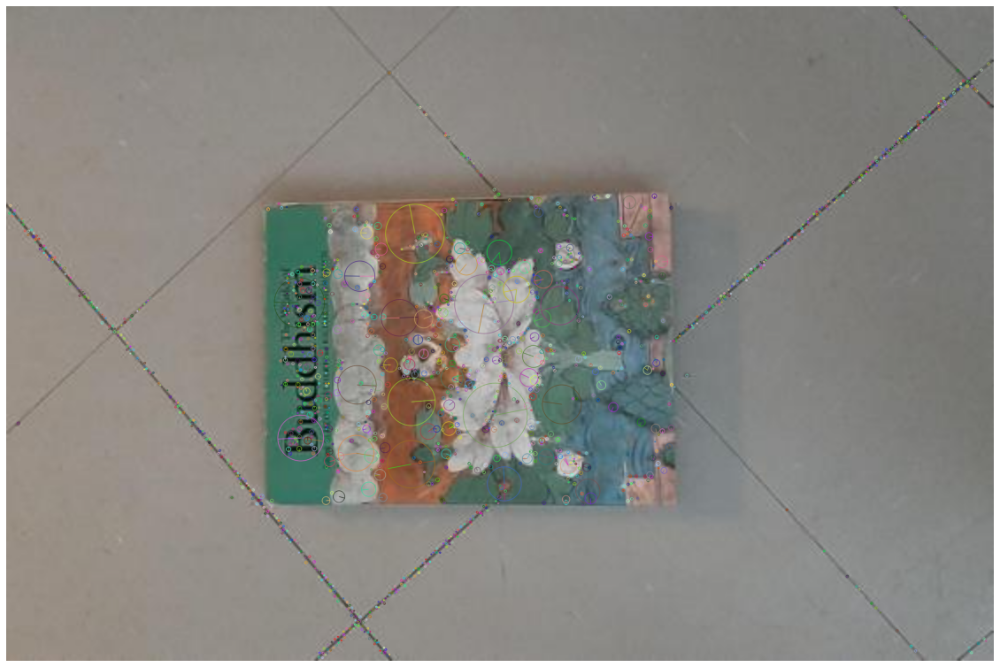

number of keypoints: 1971


In [ ]:
transformed_images.append(ssift(img_book, 5, None))

### 1.1.4 Match all keypoints of the reference image to the transformed images using a brute-force method

### 1.1.5 Sort matching keypoints according to the matching distance

### 1.1.6 Display top ten matched keypoints for each pair of reference image and a transformed image

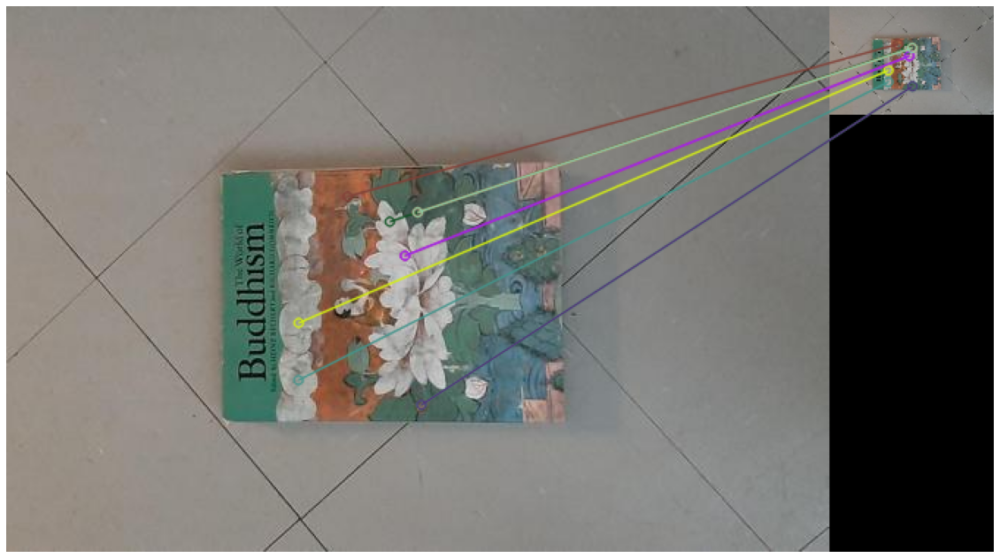

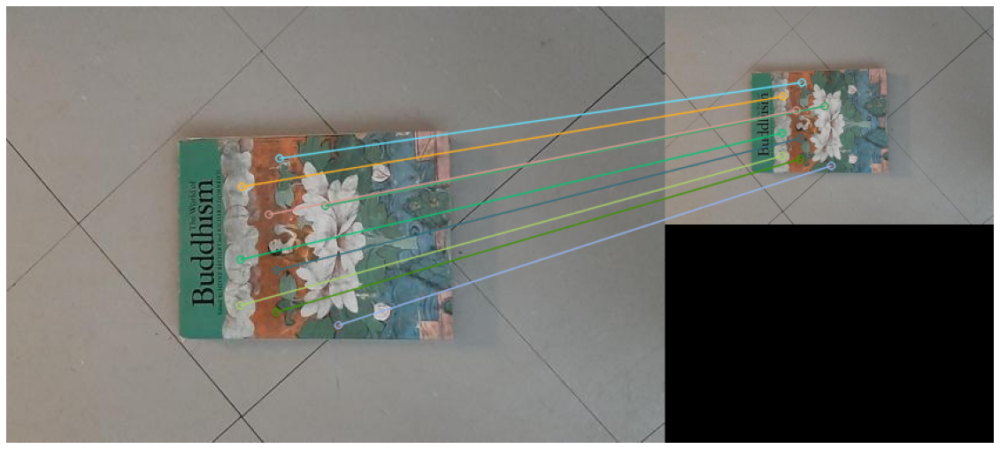

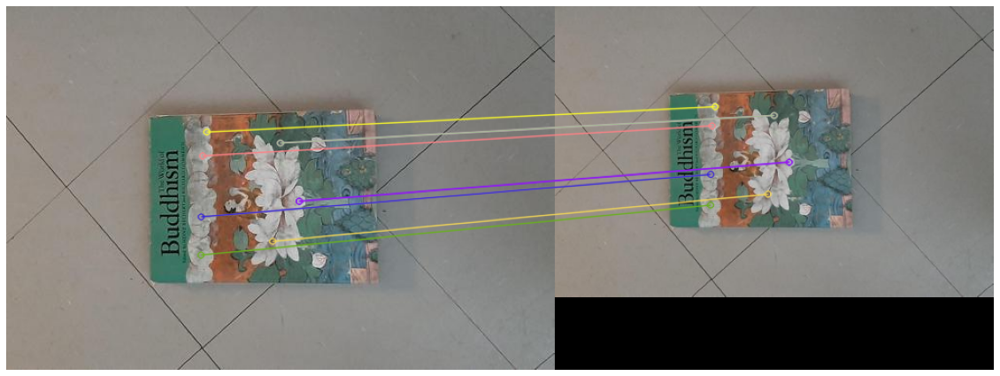

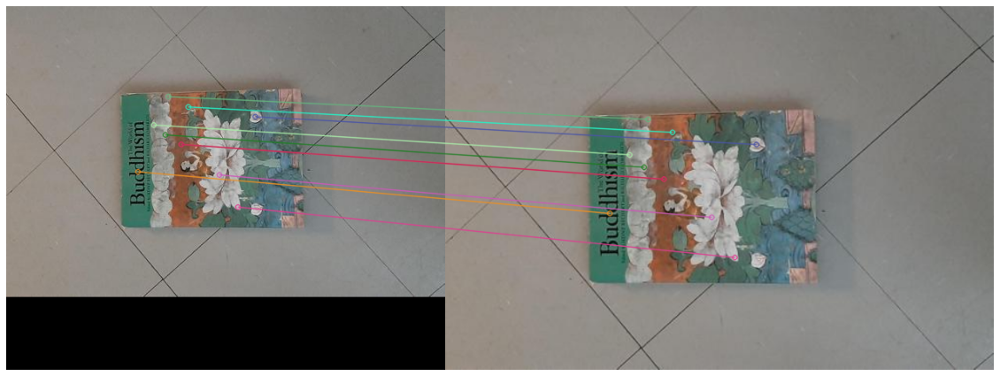

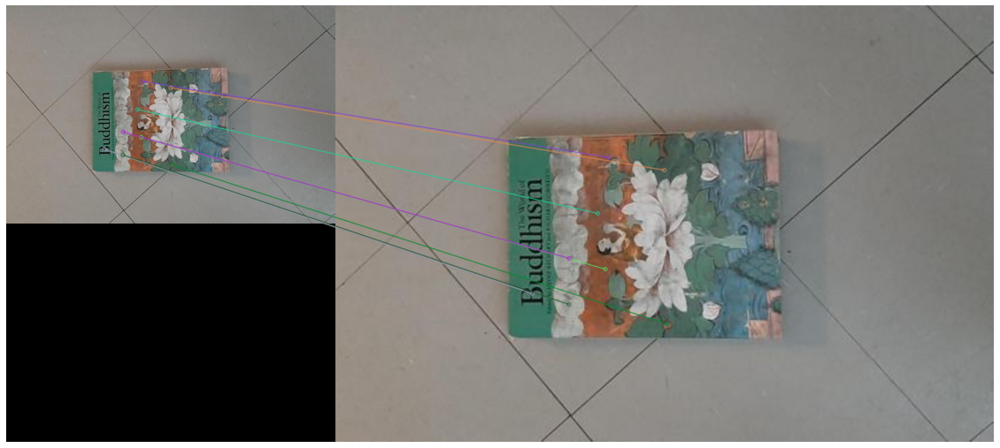

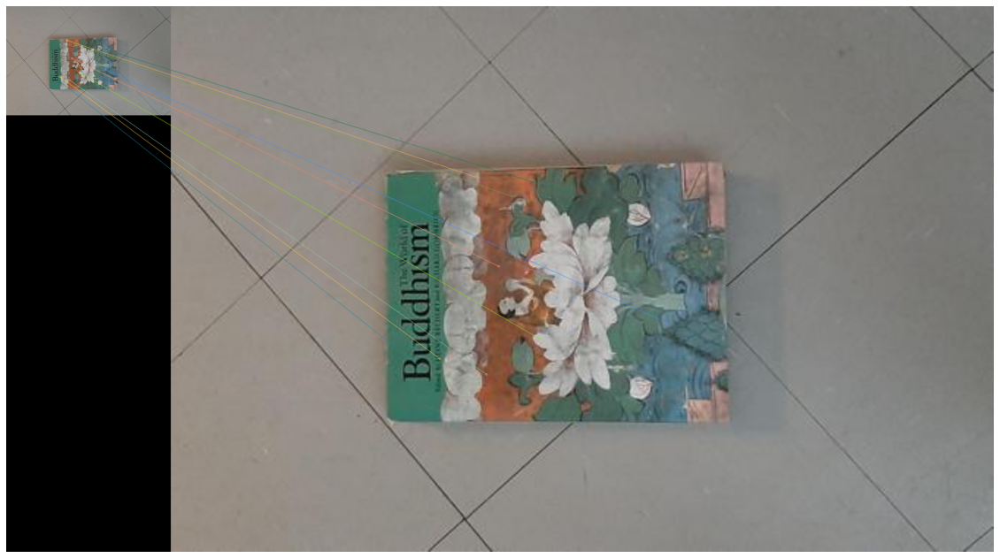

In [ ]:
matches_list = []

for img, key_point, descriptor in transformed_images:
  # 1.1.4 create BFMatcher object and Match descriptors.
  bf = cv2.BFMatcher()
  matches = bf.match(org_descriptor, descriptor)

  # 1.1.5 Sort them in the order of their distance.
  matches = sorted(matches, key=lambda x: x.distance)

  # 1.1.6 Draw first 10 matches.
  img_matched = cv2.drawMatches(origin_img, origin_key_point, img, key_point, matches[:10], None, flags=2)
  plt.figure(figsize=(20,20))
  plt.axis("off")
  plt.imshow(img_matched)
  # plt.title("Matched keypoints"), plt.xticks([]), plt.yticks([])
  plt.show()
  matches_list.append(matches)

### 1.1.7 Plot the matching distance for top 100 matched keypoints. Plot indices of keypoints on x-axis and corresponding matching distance on y-axis.

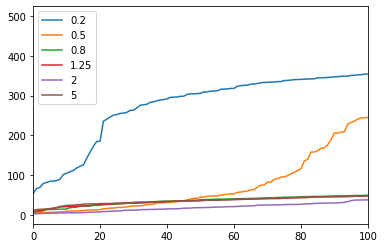

In [ ]:
i = 0
scales = [0.2, 0.5, 0.8, 1.25, 2, 5]
lines = []
for matches in matches_list:
    li, = plt.plot([match.distance for match in matches], label=str(scales[i]))
    lines.append(li)
    plt.xlim([0, 100])
    i += 1
plt.legend(handles=lines, labels=[str(scl) for scl in scales], loc='best')
plt.show()

###1.1.8 Discuss the trend in the plotted results. What is the effect of increasing the scale on the matching distance? Reason the cause

Observation
- When increasing scale from 0 to 1, matching values decreases
- Matching values does not change much anymore when scale > 0.8
- Scale in between 0 to 1 has a sudden increase in its matching distance

Reasoning
- Decreasing scale sharpens the edges which will enhance the output of DoG; Therefore, it will result in a larger value and might cause a false high matching score (for example, if the same feature descriptor in a big image has 90% black pixels and 10% white pixels, while in a smaller image it has 100% black pixels, then this might result a larger sum of squre difference)
- SIFT is invariant under scaling
- Decreasing scaling will possiblely drop some small feature descriptors so that few points can be detected as corners

##1.2 Invariance Under Rotation

###1.2.1 Compute SIFT keypoints for the reference image

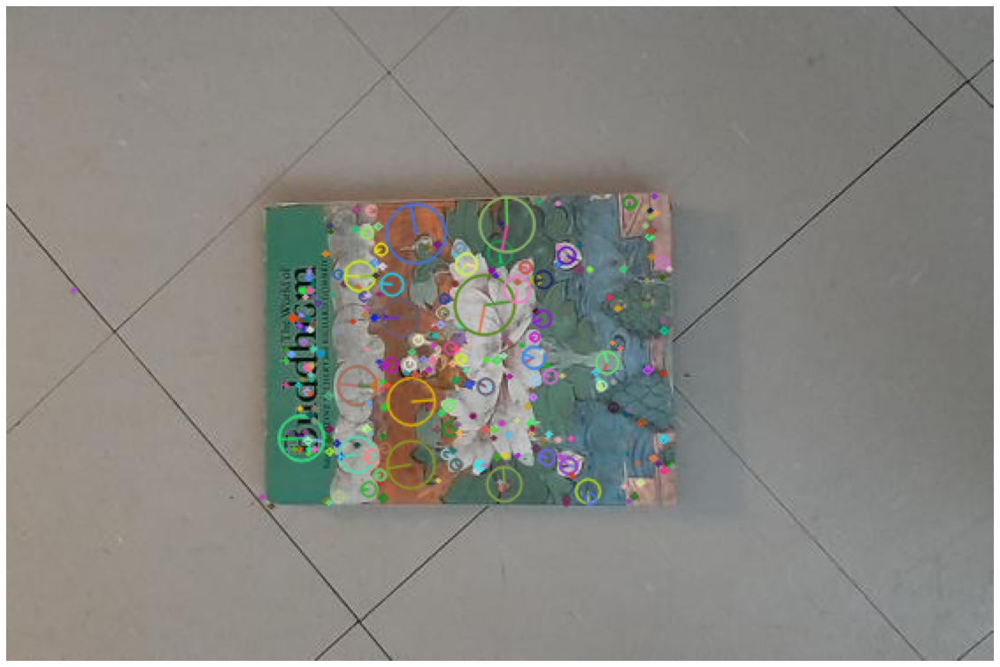

number of keypoints: 385


In [ ]:
origin_img2, origin_key_point2, org_descriptor2 = ssift(img_book, None, 0)

###1.2.2 Rotate reference image at the angle of (10, 30, 90, 150, 170, 180)

###1.2.3 Compute SIFT keypoints for the transformed images
number of keypoints are shown below each image

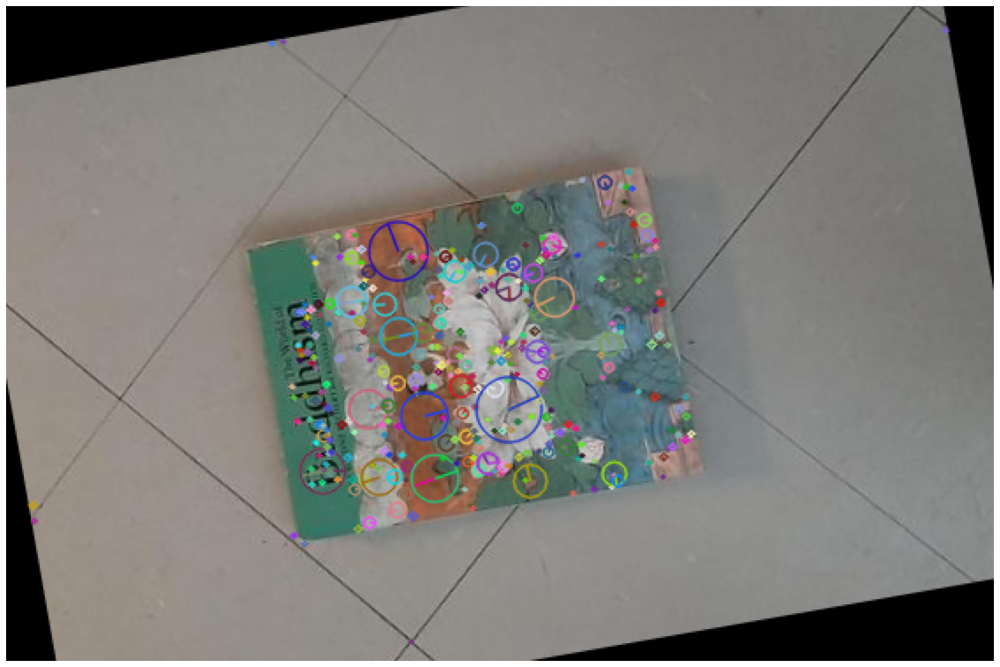

number of keypoints: 439


In [ ]:
transformed_images2 = []
transformed_images2.append(ssift(img_book, None, 10))

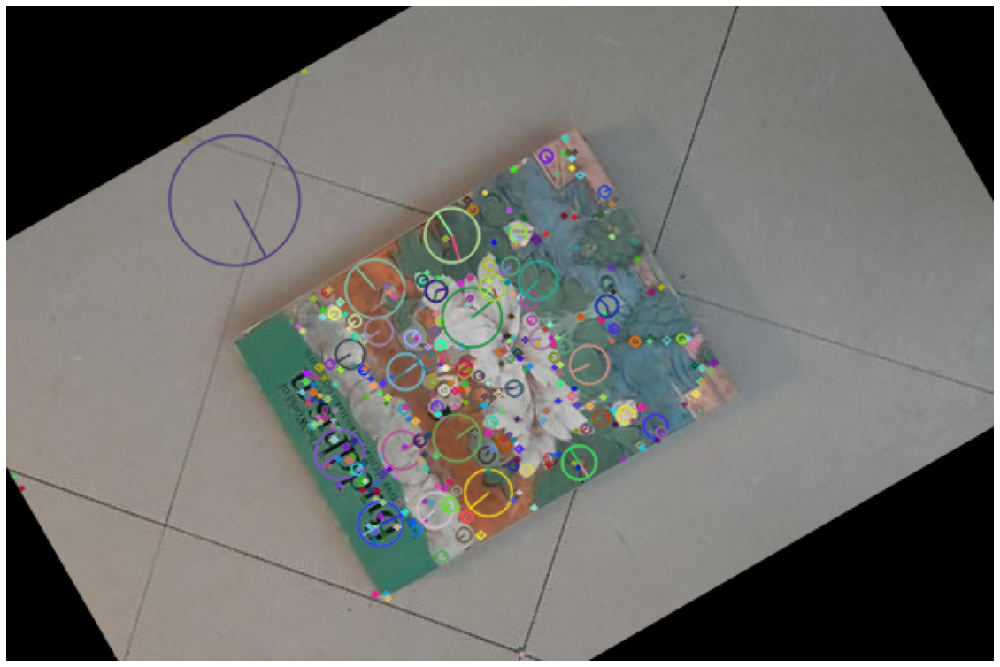

number of keypoints: 446


In [ ]:
transformed_images2.append(ssift(img_book, None, 30))

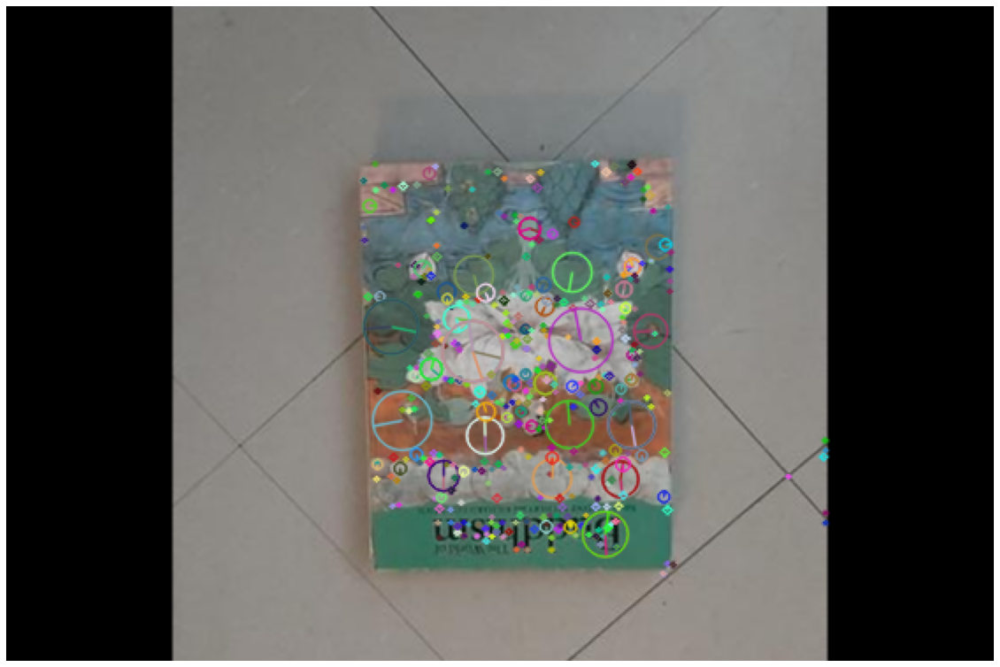

number of keypoints: 477


In [ ]:
transformed_images2.append(ssift(img_book, None, 90))

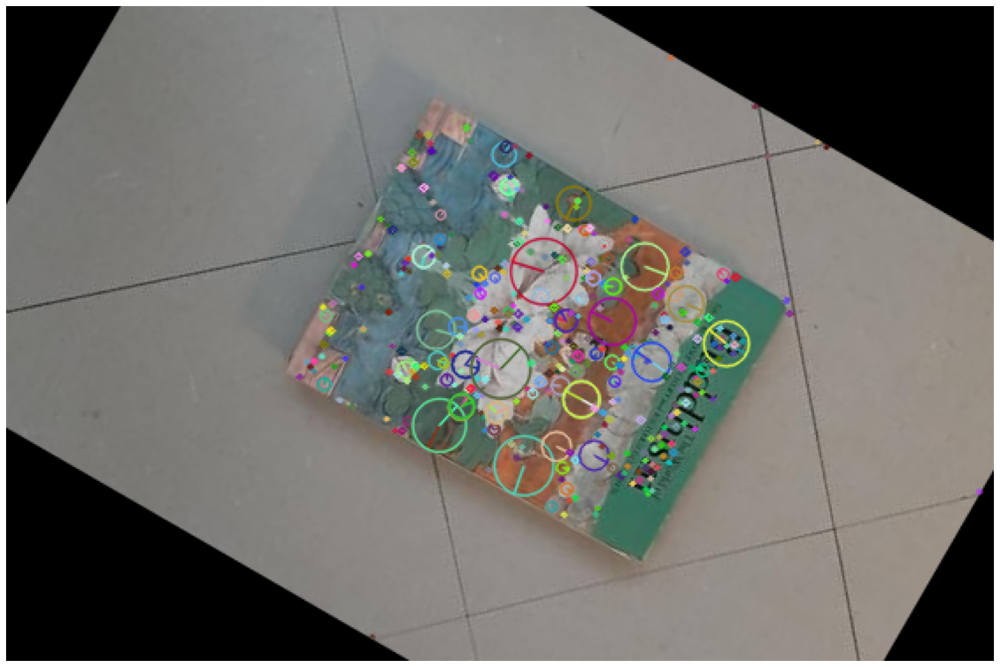

number of keypoints: 446


In [ ]:
transformed_images2.append(ssift(img_book, None, 150))

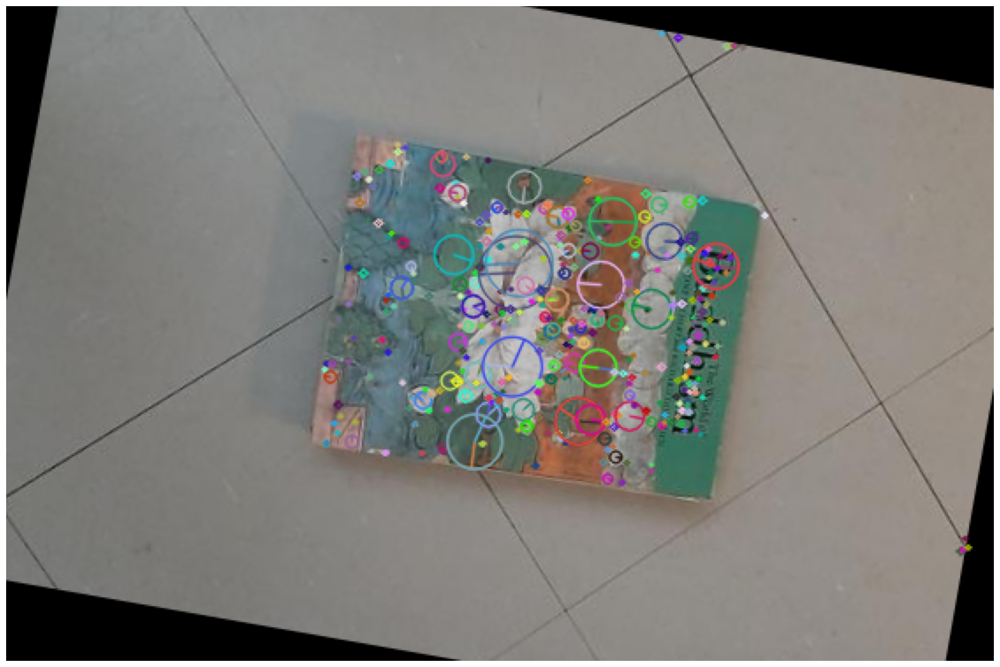

number of keypoints: 456


In [ ]:
transformed_images2.append(ssift(img_book, None, 170))

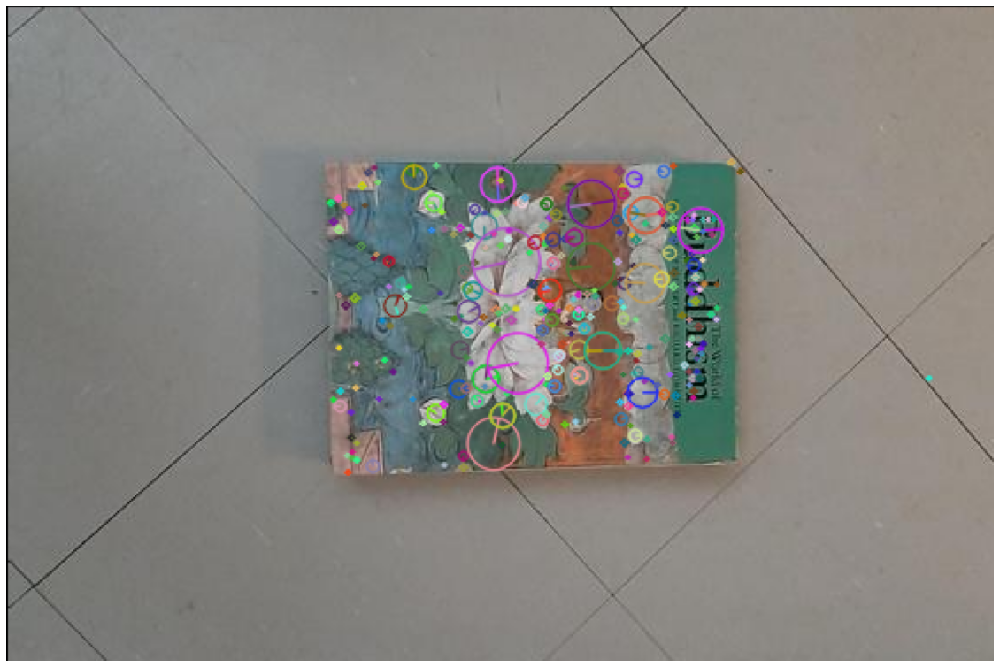

number of keypoints: 400


In [ ]:
transformed_images2.append(ssift(img_book, None, 180))

###1.2.4 Match all keypoints of the reference image to the transformed images using a brute-force method

###1.2.5 Sort matching keypoints according to the matching distance

###1.2.6 Display top ten matched keypoints for each pair of reference image and a transformed image

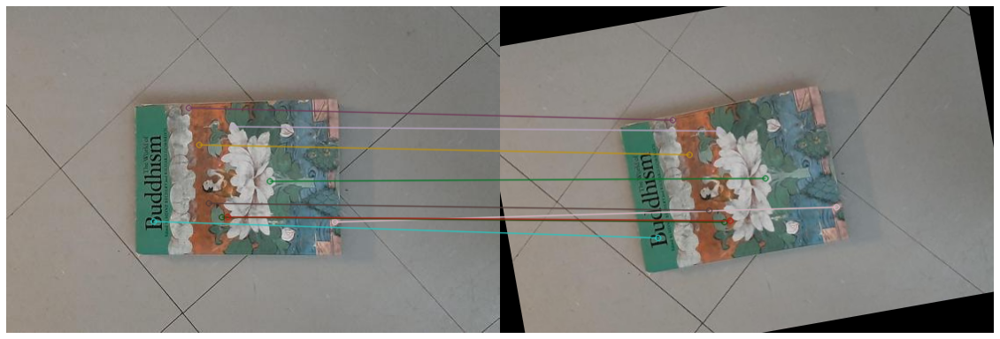

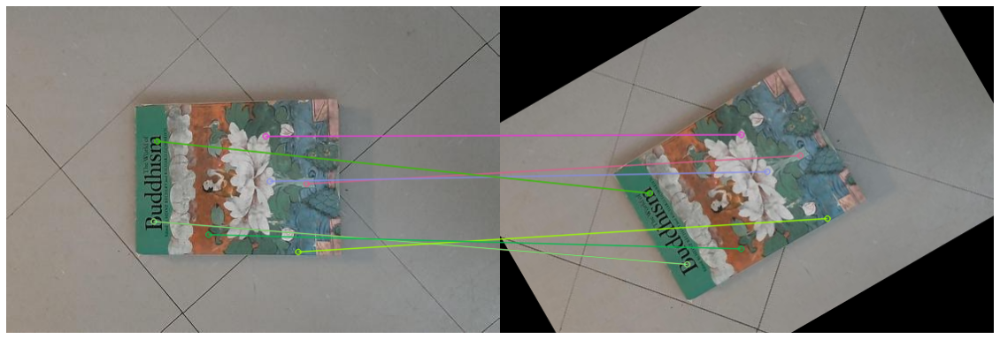

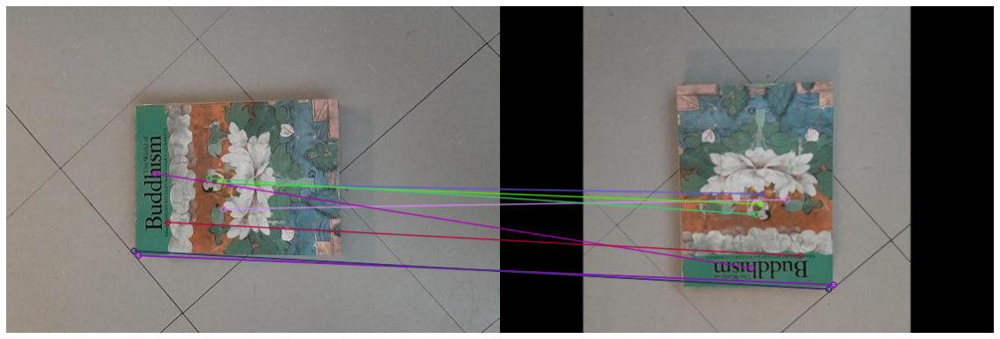

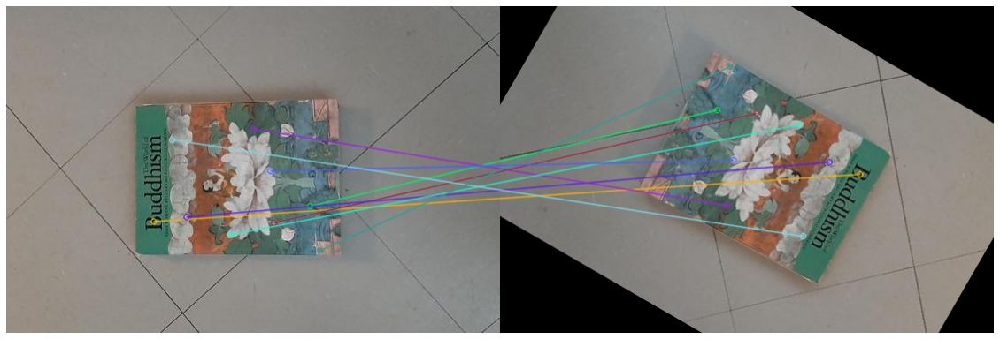

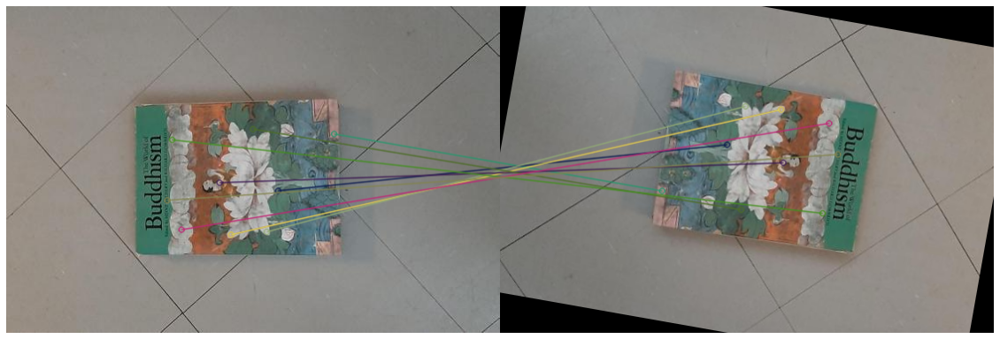

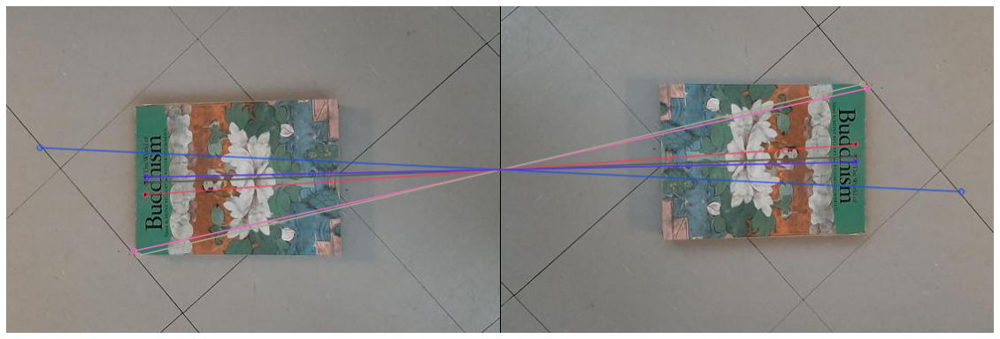

In [ ]:
matches_list2 = []
for img, key_point, descriptor in transformed_images2:
  # 1.2.4 create BFMatcher object and Match descriptors.
  bf = cv2.BFMatcher()
  matches = bf.match(org_descriptor2, descriptor)

  # 1.2.5 Sort them in the order of their distance.
  matches = sorted(matches, key=lambda x: x.distance)

  # 1.2.6 Draw first 10 matches.
  img_matched = cv2.drawMatches(origin_img2, origin_key_point2, img, key_point, matches[:10], None, flags=2)
  plt.figure(figsize=(20,20))
  plt.axis("off")
  plt.imshow(img_matched)
  # plt.title("Matched keypoints"), plt.xticks([]), plt.yticks([])
  plt.show()
  matches_list2.append(matches)

###1.2.7 Plot the matching distance for top 100 matched keypoints. Plot indices of keypoints on x-axis and corresponding matching distance on y-axis

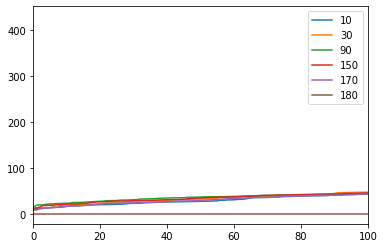

In [ ]:
i = 0
rots = [10, 30, 90, 150, 170, 180]
lines2 = []
for matches in matches_list2:
    li, = plt.plot([match.distance for match in matches], label=str(rots[i]))
    lines2.append(li)
    plt.xlim([0, 100])
    i += 1
plt.legend(handles=lines2, labels=[str(rot) for rot in rots], loc='best')
plt.show()

###1.2.8 Discuss the trend in the plotted results. What is the effect of increasing the angle of rotation on the matching distance? Reason the cause
Observation
- There is no obvious change in matching values from 10 to 170 degrees
- Matching values is significantly lower in 180 degree than 10 to 170 degrees and is close to 0

Reasoning
- SIFT is invariant under rotation
- In 180 degree, almost all of the pixels in feature descriptors is 'mismatched', and sum of square differences then decreased to almost 0. 

#2 Matching using SIFT - Book Reveal 

In [ ]:
# load the image
img_book_crop = cv2.cvtColor(cv2.imread("book_crop.jpg"), cv2.COLOR_BGR2RGB)
img_book_occl = cv2.cvtColor(cv2.imread("book_occlusion.jpg"), cv2.COLOR_BGR2RGB)

##2.1 Find SIFT keypoints in given input images

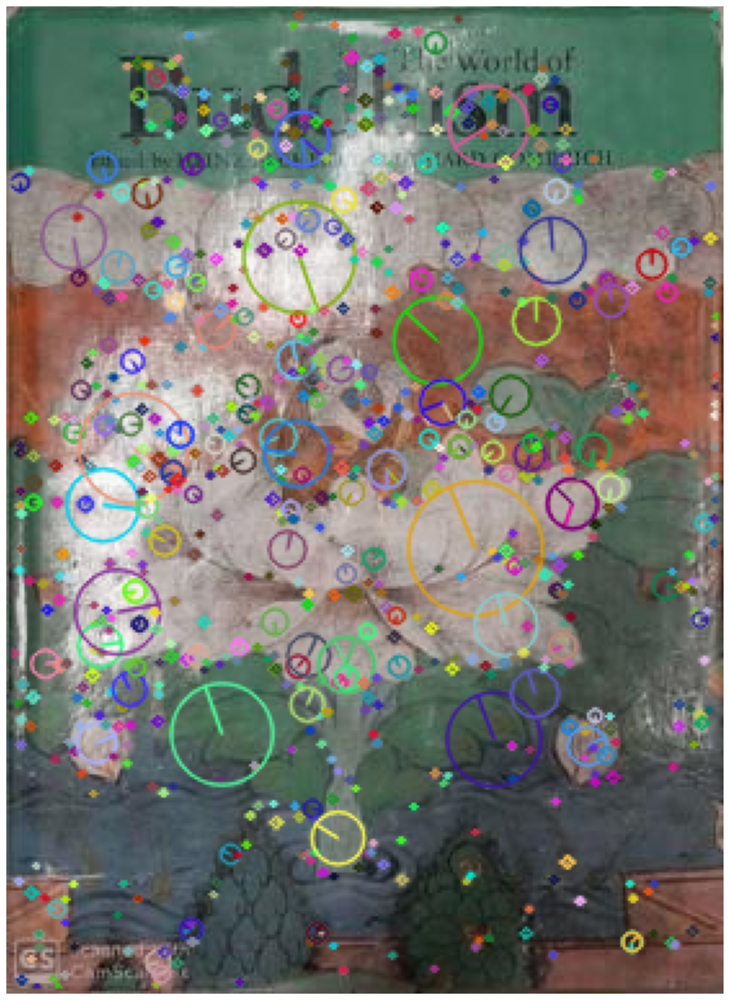

number of keypoints: 947


In [ ]:
crop_img, crop_key_point, crop_descriptor = ssift(img_book_crop, None, None)

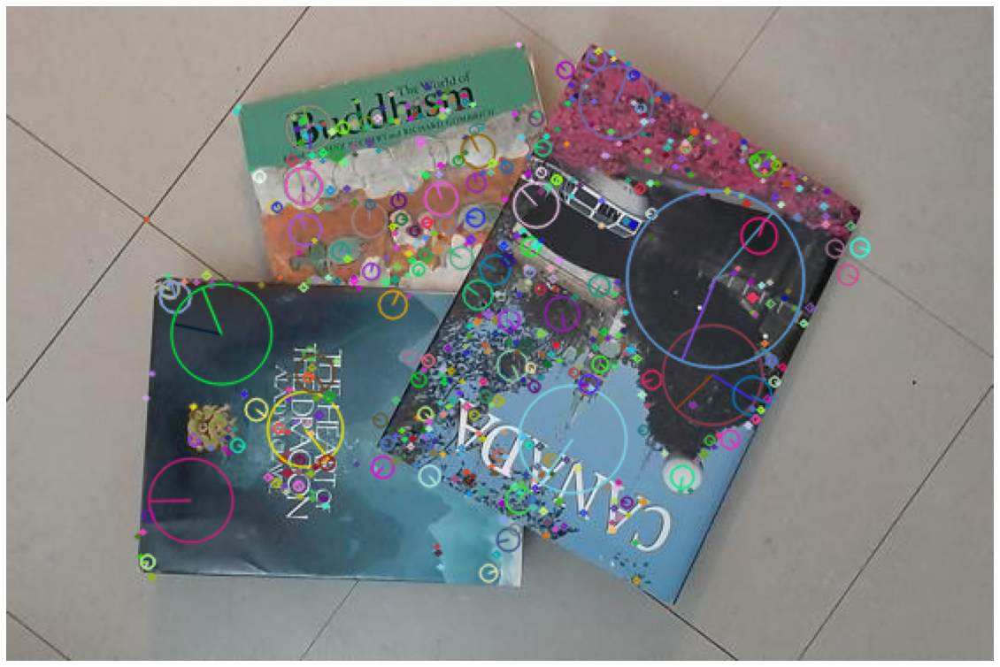

number of keypoints: 769


In [ ]:
occl_img, occl_key_point, occl_descriptor = ssift(img_book_occl, None, None)

##2.2 Match keypoints of reference image to the keypoints of the occluded image using brute-force method

##2.3 Sort matching keypoints according to the matching distance

##2.4 Display top ten matching keypoints

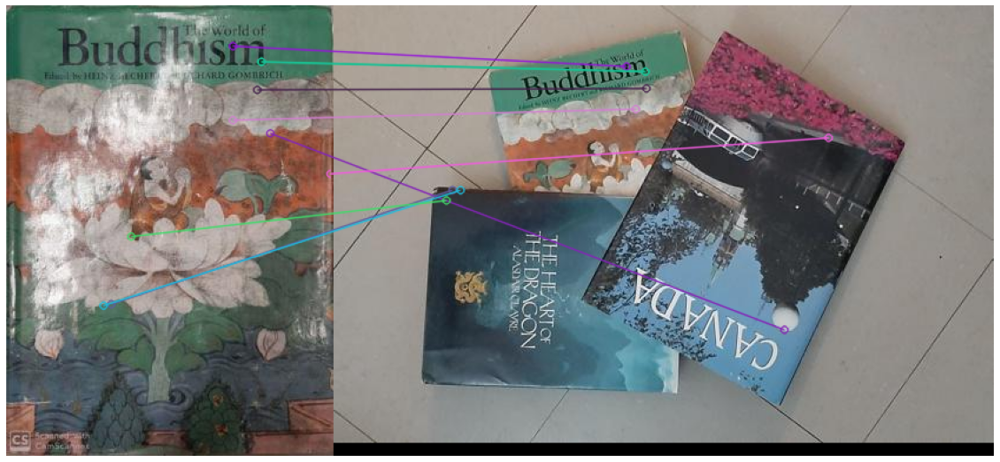

In [ ]:
crop_occl_matches_list = []

# 2.2 Create BFMatcher object and Match keypoints
bf = cv2.BFMatcher()
matches_crop_occl = bf.match(crop_descriptor, occl_descriptor)

# 2.3 Sort them in the order of their distance.
matches_crop_occl = sorted(matches_crop_occl, key=lambda x: x.distance)

# 2.4 Display top ten matching keypoints.
img_matched_crop_occl = cv2.drawMatches(crop_img, crop_key_point, occl_img, occl_key_point, matches_crop_occl[:10], None, flags=2)
plt.figure(figsize=(20,20))
plt.axis("off")
plt.imshow(img_matched_crop_occl)
plt.show()

##2.5 Compute a homography to align the images using RANSAC method and apply the transformation on the reference image

##2.6 Paste transformed reference image on the occluded view to generate un- occluded view

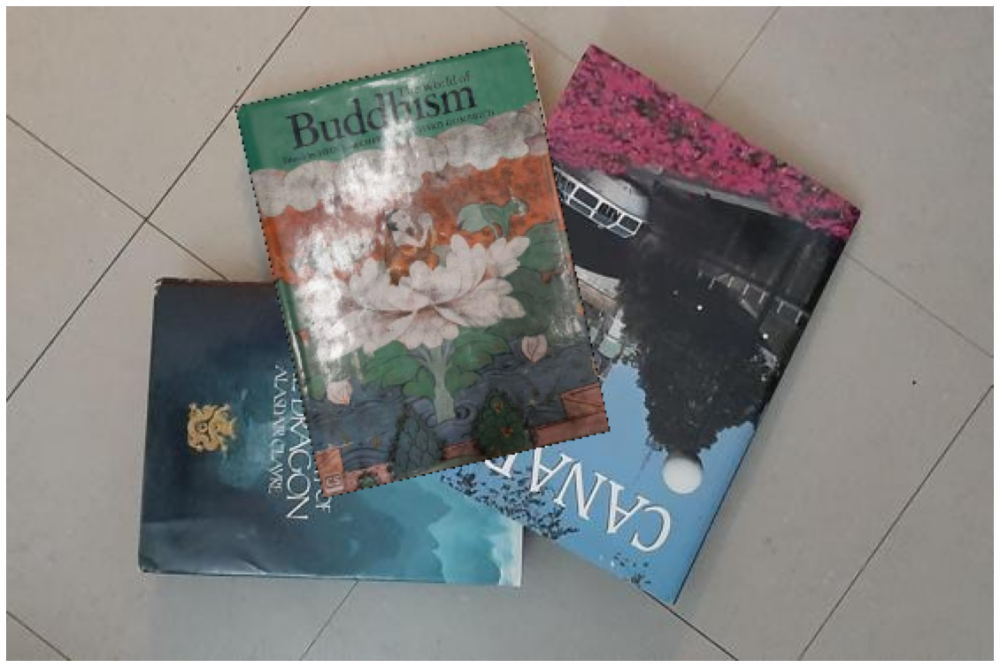

In [ ]:
# Arrange matching keypoints in two separate lists
GoodMatches = []
for i, m in enumerate(matches_crop_occl):
  if m.distance < 170:
    GoodMatches.append((m.trainIdx, m.queryIdx))

mpr = np.float32([crop_key_point[i].pt for (__, i) in GoodMatches])
mpl = np.float32([occl_key_point[i].pt for (i, __) in GoodMatches])

# 2.5 Compute a homography to align the images using RANSAC method
H, __ = cv2.findHomography(mpr, mpl, cv2.RANSAC, 4)
    
# 2.6 apply the transformation on the reference image
wimg = cv2.warpPerspective(crop_img, H, (occl_img.shape[1], occl_img.shape[0]))

plt.figure(figsize=(20,20))
plt.axis("off")
plt.imshow(wimg)
# Paste transformed reference image on the occluded view to generate un-occluded view
for row in range(wimg.shape[0]):
  for col in range(wimg.shape[1]):
    if wimg[row][col].all() == 0:
      for i in range(wimg.shape[2]):
        wimg[row][col][i] = occl_img[row][col][i]
plt.imshow(wimg)
plt.show()

#3 Face detection

##3.1 Eigenface Representation

In [ ]:
path_celebA = "drive/My Drive/Colab Notebooks/celebA_subset/"
files = os.listdir(path_celebA)
my_files = []

for i in range(0,100):
  my_files.append(files[i])

In [ ]:
def PPCA (files):
  # This variable will store 100 cinversions of image to 1-D
  face_mat = []
  for i in range(len(files)):
    image_PCA = cv2.cvtColor(cv2.imread(path_celebA + files[i]), cv2.COLOR_BGR2GRAY)
    image_PCA = image_PCA.flatten()
    face_mat.append(image_PCA)

  face_mat = np.matrix(face_mat)
  matrix = face_mat.transpose()
  combined = np.matmul(face_mat,matrix)

  # mean subtraction and zero mean
  # There are 100 blocks with each with 38804 dimension
  eigen_values, eigen_vectors = np.linalg.eig(combined)
  best_eigen_vectors = eigen_vectors[0:6, :]
  eigen_faces = best_eigen_vectors.dot(np.transpose(matrix))

  weights = np.transpose(matrix).dot(np.transpose(eigen_faces))

  plt.figure(figsize=(15,15))
  for i in range(6):
    plt.subplot(2, 3, i + 1)
    plt.imshow(eigen_faces[i].reshape(218,178),cmap=plt.cm.gray)
    plt.xticks(())
    plt.yticks(())
  plt.show()

  return matrix, eigen_faces, weights 

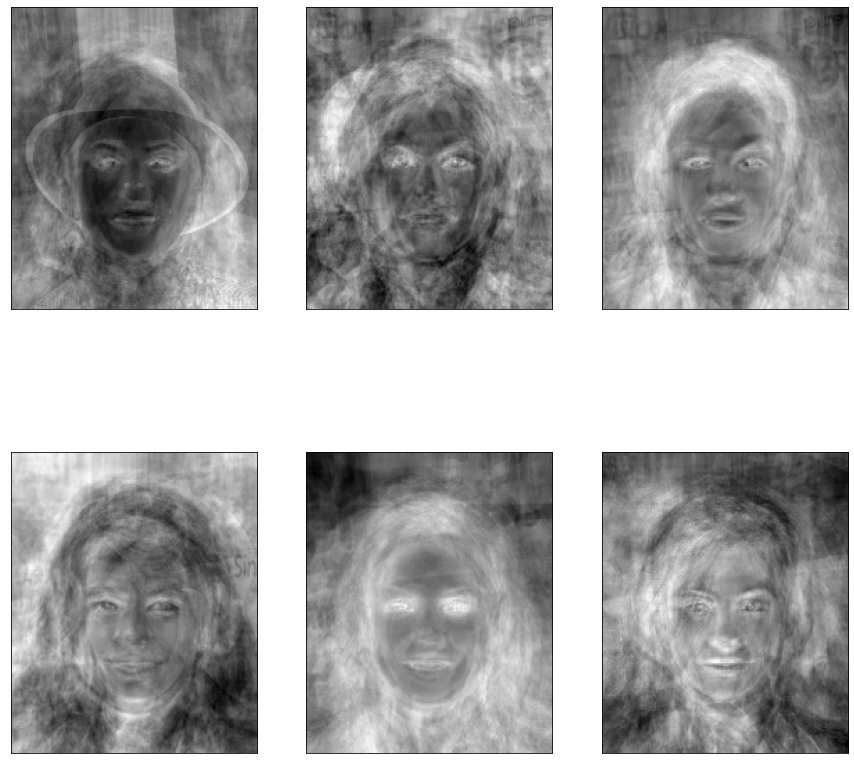

In [ ]:
matrix, eigen_faces, weights = PPCA(my_files)

##3.2 Face Detection

In [ ]:
def slidingwindow(image, stepSize, windowSize):
    for y in range(180, 250, stepSize):
        for x in range(150, 1200, stepSize):
            yield (x, y, image[y:y + windowSize[1], x:x + windowSize[0]])

In [ ]:
def detection(win_size, resize_dim, ide, threshold, test_img, img_vector_mean, eigen_faces, weights):
    (win_w, win_h) = win_size  
    step_size = ide    
    faces = []
    detect_img = cv2.imread("schitt's_creek_group_photo.jpeg")
    detect_img = cv2.cvtColor(detect_img, cv2.COLOR_BGR2RGB)
    decect_img_gray = cv2.cvtColor(detect_img, cv2.COLOR_RGB2GRAY)

    for (x, y, window) in slidingwindow(decect_img_gray, step_size, (win_w, win_h)): 
        window = cv2.resize(window, resize_dim, interpolation = cv2.INTER_AREA)            
        window_org = window 
        window = window.reshape(38804, 1)
        test_norm_face = window - img_vector_mean
        test_weight = np.transpose(test_norm_face).dot(np.transpose(eigen_faces))
        norm = np.linalg.norm(test_weight - weights, ord=2, axis=1)
        dist = min(norm)
        
        if (dist < threshold):
            cv2.rectangle(decect_img_gray, (x, y), (x + win_w, y + win_h), (255, 0, 0), 3)
            faces.append(window_org)

    fig=plt.figure(figsize=(15,10))
    plt.imshow(decect_img_gray, cmap="gray")
    plt.xticks(())
    plt.yticks(()) 
    plt.show()
    
    return faces

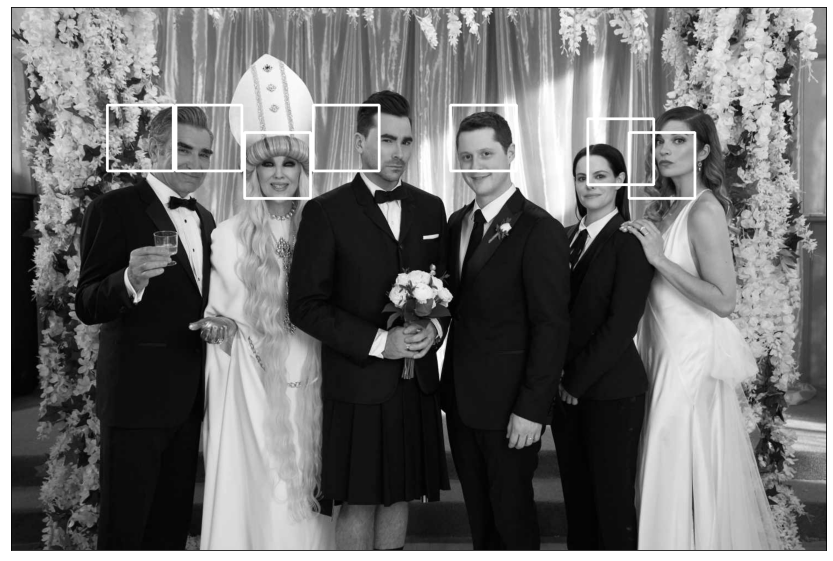

In [ ]:
img = cv2.imread("schitt's_creek_group_photo.jpeg", 0)
detections = detection((120,120), (178, 218), 25, 31300000, img , matrix, eigen_faces, weights)

- How well does the method work?
  - The implemented face detection can to some extend, detect all faces in this image with a threshold of 31,300,000. But there is a duplicated detection in the left side and two of the detected faces are labelled a bit away from the center of the faces. 
- How many false positive face detections do you get? 
  - 2 --- the 1st windown from the left and the 4th window from the left can be considered as false positives.

Viola-Jones detection

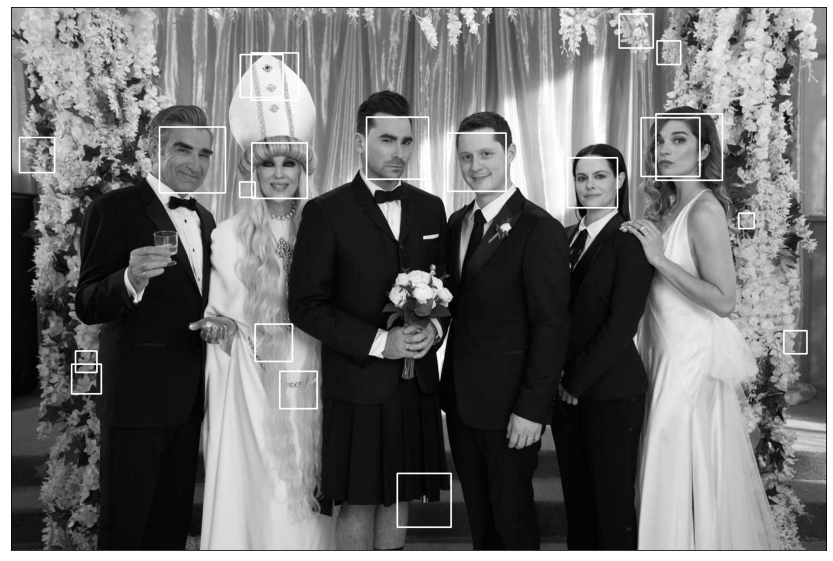

In [ ]:
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

img_vj = cv2.imread("schitt's_creek_group_photo.jpeg")
img_gray_vj = cv2.cvtColor(img_vj, cv2.COLOR_BGR2GRAY)

# detecMutliScale
#   Params: image – Matrix of the type CV_8U containing an image where objects are detected.
#           scaleFactor (1.1) – Parameter specifying how much the image size is reduced at each image scale.
#           minNeighbors (3) – Parameter specifying how many neighbors each candidate rectangle should have to retain it.
#           minSize (0,0) – Minimum possible object size. Objects smaller than that are ignored.
#           maxSize (0,0) – Maximum possible object size. Objects larger than that are ignored.

faces = face_cascade.detectMultiScale(img_gray_vj, 1.1, 2)

for (x,y,w,h) in faces:
    img_gray_vj = cv2.rectangle(img_gray_vj,(x,y),(x+w,y+h),(255,0,0),2)

fig=plt.figure(figsize=(15,10))
plt.imshow(img_gray_vj, cmap="gray")
plt.xticks(())
plt.yticks(())
plt.show()

- Compare Viola-Jones detector with the implemented detector:
  - Viola-Jones detection can accurately detect all faces but it will also detect way many false positives than the implmented detector.
- how many false positives do you obtain?
    - 14 false positives are detected by Viola-Jones detector.
- Under what conditions would you expect the Viola-Jones detector to work when PCA does not? 
  - PCA is very sensitive to scale, so, a low level pre-processing is still necessary for scale normalization. If the database given is not properly pre-processed, then PCA might not work well
  - Its recognition rate decreases for recognition under varying pose and illumination; so that PCA might not properly detect side face or facees with occlusion.